In [46]:
from functions import *

### Plot data from XPS .txt file from Avantage

remember: you need to export ”peak BE", "FWHM", "Area", “Height”, "Atomic %" 

In [56]:

folder = r"Z:\P110143-phosphosulfides-Andrea\Data\Samples\mittma_0023_Cu\XPS"

sample = "mittma_0023_FL_core_all_NOQUANT"
filename = sample + ".txt"
filename = os.path.join(folder, filename)

grid= measurement_grid(9,9,32,32,-16,-16) 

initial_data,coords = read_XPS(filename, grid)

Coordinate -16.0,16.0                                            \
Data type        Peak Peak BE (eV) Intensity (counts) FWHM (eV)   
0                P2p3      129.175          336.33212     0.823   
1                P2p1      130.075           171.7894     0.823   
2                S2p3      161.872          171.71312     1.192   
3                S2p1      162.972           87.71296      1.19   
4                 C1s      284.688          226.95816     1.531   
5                 C1s      286.165            37.5812       2.4   
6               Sb3d5       530.35           295.0048     2.006   
7                 O1s      532.703          286.37804     1.671   
8               Sb3d3       539.55          204.46016     2.006   
9                  Cu      566.479          475.42604     1.788   
10                 Cu      569.032         1717.37572     1.961   
11                 Cu      571.902          302.81596     3.529   
12               Cu2p      933.089          3081.7326     1.462   
13               Cu2p      952.888         1075.79316     1.996   

Coordinate                                                             \
Data type  Area (counts*eV) Atomic % P2p3 Total P2p1 Total S2p3 Total   
0                 32368.262    8.639      8.639      8.643      4.685   
1                 16532.839    8.643        NaN        NaN        NaN   
2                  23947.03    4.685        NaN        NaN        NaN   
3                 12232.407    4.688        NaN        NaN        NaN   
4                 40737.645   10.697        NaN        NaN        NaN   
5                 10474.406    2.753        NaN        NaN        NaN   
6                 69265.273    0.921        NaN        NaN        NaN   
7                  56084.23    6.097        NaN        NaN        NaN   
8                 48033.499    0.929        NaN        NaN        NaN   
9                 99730.154    2.796        NaN        NaN        NaN   
10                394774.64   11.092        NaN        NaN        NaN   
11               124244.047    3.499        NaN        NaN        NaN   
12              1320650.734   23.258        NaN        NaN        NaN   
13               625417.389   11.302        NaN        NaN        NaN   

Coordinate             ... 16.0,-16.0                                   \
Data type  S2p1 Total  ... P2p3 Total P2p1 Total S2p3 Total S2p1 Total   
0               4.688  ...      7.948      7.952      5.017       5.02   
1                 NaN  ...        NaN        NaN        NaN        NaN   
2                 NaN  ...        NaN        NaN        NaN        NaN   
3                 NaN  ...        NaN        NaN        NaN        NaN   
4                 NaN  ...        NaN        NaN        NaN        NaN   
5                 NaN  ...        NaN        NaN        NaN        NaN   
6                 NaN  ...        NaN        NaN        NaN        NaN   
7                 NaN  ...        NaN        NaN        NaN        NaN   
8                 NaN  ...        NaN        NaN        NaN        NaN   
9                 NaN  ...        NaN        NaN        NaN        NaN   
10                NaN  ...        NaN        NaN        NaN        NaN   
11                NaN  ...        NaN        NaN        NaN        NaN   
12                NaN  ...        NaN        NaN        NaN        NaN   
13                NaN  ...        NaN        NaN        NaN        NaN   

Coordinate                                                                  
Data type  C1s Total Sb3d5 Total O1s Total Sb3d3 Total Cu Total Cu2p Total  
0             14.089       0.496     7.395       0.501   17.076     34.505  
1                NaN         NaN       NaN         NaN      NaN        NaN  
2                NaN         NaN       NaN         NaN      NaN        NaN  
3                NaN         NaN       NaN         NaN      NaN        NaN  
4                NaN         NaN       NaN         NaN      NaN        NaN  
5                NaN         NaN  

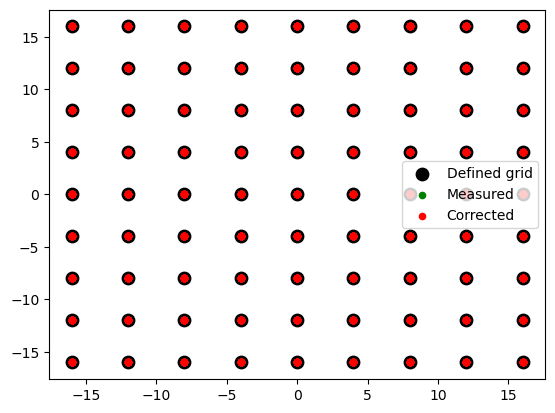

In [57]:
# data = rotate_coordinates(initial_data, how='clockwise') # only for mittma_0019 bacuse it was mounted on the wrong direction (rotate it clockwise to correct)
data = initial_data
coords= MI_to_grid(data)
plot_grid(coords, grid)
display(data)

In [58]:
# data.columns.get_level_values(1).unique()
elements_list=[]
el_list=[]
for type in data.columns.get_level_values(1).unique():
    try:
        if type.split(" ")[1]== 'Total':
            element = type.split(" ")[0] 
            elements_list.append(element)
            try:
                # print(element.split()[0][0])
                float(element.split()[0][1]) #if there is a number in position 1 
                el= element.split()[0][0]
                el_list.append(el)
            except:
                el=element.split()[0][0]+ element.split()[0][1]
                el_list.append(el)
    except IndexError:
        pass
print(elements_list)
print(el_list)


['P2p3', 'P2p1', 'S2p3', 'S2p1', 'C1s', 'Sb3d5', 'O1s', 'Sb3d3', 'Cu', 'Cu2p']
['P', 'P', 'S', 'S', 'C', 'Sb', 'O', 'Sb', 'Cu', 'Cu']


In [ ]:
os.makedirs(os.path.join(folder, 'plots'), exist_ok=True) # check if a 'plots' folder exists, if not create it
for i in range(len(elements_list)):
    el = elements_list[i]
    element = el_list[i]
    print(el)
    savepath = os.path.join(folder, 'plots', f'{sample}_{el}.png')
    new_heatmap(datatype= f'{el} Total', data=data, title = f'{sample} {element} atomic %', cbar= f'{element} %',
                 exclude=['4.0,16.0'],  # if you want to exclude some point
                # savepath= savepath # if you want to save the plots
                )

#### plot other quantities

In [53]:
data_ratios= math_on_columns(data, 'P2p3 Total', 'S2p3 Total', '/')
data_ratios.rename(columns={'P2p3 Total / S2p3 Total': 'P_S_ratio'}, level=1, inplace=True)
data_ratios= math_on_columns(data_ratios, 'P2p3 Total', 'S2p3 Total', '+')
data_ratios= math_on_columns(data_ratios, 'Cu2p Total', 'P2p3 Total + S2p3 Total' , '/')
data_ratios.rename(columns={'Cu2p Total / P2p3 Total + S2p3 Total': 'Cu_anions_ratio'}, level=1, inplace=True)
data_ratios= math_on_columns(data_ratios, 'Cu2p Total', 'P2p3 Total' , '/')
data_ratios.rename(columns={'Cu2p Total / P2p3 Total': 'Cu_P_ratio'}, level=1, inplace=True)
data_ratios= math_on_columns(data_ratios, 'Cu2p Total', 'S2p3 Total' , '/')
data_ratios.rename(columns={'Cu2p Total / S2p3 Total': 'Cu_S_ratio'}, level=1, inplace=True)

display(data_ratios)

Coordinate -16.0,16.0                                            \
Data type        Peak Peak BE (eV) Intensity (counts) FWHM (eV)   
0                 C1s      284.688          226.95816     1.531   
1                 C1s      286.165            37.5812       2.4   
2                Cu2p      952.888         1075.79316     1.996   
3                Cu2p      933.089          3081.7326     1.462   
4                S2p3      161.872          171.71312     1.192   
5               Sb3d3       539.55          204.46016     2.006   
6                 O1s      532.703          286.37804     1.671   
7                P2p3      129.175          336.33212     0.823   

Coordinate                                                            \
Data type  Area (counts*eV) Atomic % C1s Total Cu2p Total S2p3 Total   
0                 40737.645   15.648    19.675     50.557      6.854   
1                 10474.406    4.027       NaN        NaN        NaN   
2                625417.389   16.534       NaN        NaN        NaN   
3               1320650.734   34.023       NaN        NaN        NaN   
4                  23947.03    6.854       NaN        NaN        NaN   
5                 48033.499    1.358       NaN        NaN        NaN   
6                  56084.23    8.919       NaN        NaN        NaN   
7                 32368.262   12.637       NaN        NaN        NaN   

Coordinate              ... 16.0,-16.0                                   \
Data type  Sb3d3 Total  ... Cu2p Total S2p3 Total Sb3d3 Total O1s Total   
0                1.358  ...      49.68      7.223       0.721    10.647   
1                  NaN  ...        NaN        NaN         NaN       NaN   
2                  NaN  ...        NaN        NaN         NaN       NaN   
3                  NaN  ...        NaN        NaN         NaN       NaN   
4                  NaN  ...        NaN        NaN         NaN       NaN   
5                  NaN  ...        NaN        NaN         NaN       NaN   
6                  NaN  ...        NaN        NaN         NaN       NaN   
7                  NaN  ...        NaN        NaN         NaN       NaN   

Coordinate                                                               \
Data type  P2p3 Total P_S_ratio P2p3 Total + S2p3 Total Cu_anions_ratio   
0              11.444  1.584383                  18.667        2.661381   
1                 NaN       NaN                     NaN             NaN   
2                 NaN       NaN                     NaN             NaN   
3                 NaN       NaN                     NaN             NaN   
4                 NaN       NaN                     NaN             NaN   
5                 NaN       NaN                     NaN             NaN   
6                 NaN       NaN                     NaN             NaN   
7                 NaN       NaN                     NaN             NaN   

Coordinate                        
Data type  Cu_P_ratio Cu_S_ratio  
0            4.341139   6.878029  
1                 NaN        NaN  
2                 NaN        NaN  
3                 NaN        NaN  
4                 NaN        NaN  
5                 NaN        NaN  
6                 NaN        NaN  
7                 NaN        NaN  

[8 rows x 1377 columns]

In [55]:
os.makedirs(os.path.join(folder, 'plots'), exist_ok=True) # check if a 'plots' folder exists, if not create it
ratios= ['P_S_ratio', 'Cu_anions_ratio', 'Cu_P_ratio', 'Cu_S_ratio']
for i in range(len(ratios)):
    ratio = ratios[i]
    num = ratio.split('_')[0]
    den= ratio.split('_')[1]
    savepath = os.path.join(folder, 'plots', f'{sample}_{ratio}.png')
    new_heatmap(datatype= ratio, data=data_ratios, title = f'{sample} {ratio}', cbar= f'{num}/{den}',
                 exclude=['4.0,16.0'], #,'16.0,16.0'],  # if you want to exclude some point, write the point 'x.0,y.0' no spaces, 1 decimal
                savepath= savepath # if you want to save the plots
                )

#### plot peak BE and Area counts, from non quant file

In [60]:
display(data)

Coordinate -16.0,16.0                                            \
Data type        Peak Peak BE (eV) Intensity (counts) FWHM (eV)   
0                P2p3      129.175          336.33212     0.823   
1                P2p1      130.075           171.7894     0.823   
2                S2p3      161.872          171.71312     1.192   
3                S2p1      162.972           87.71296      1.19   
4                 C1s      284.688          226.95816     1.531   
5                 C1s      286.165            37.5812       2.4   
6               Sb3d5       530.35           295.0048     2.006   
7                 O1s      532.703          286.37804     1.671   
8               Sb3d3       539.55          204.46016     2.006   
9                  Cu      566.479          475.42604     1.788   
10                 Cu      569.032         1717.37572     1.961   
11                 Cu      571.902          302.81596     3.529   
12               Cu2p      933.089          3081.7326     1.462   
13               Cu2p      952.888         1075.79316     1.996   

Coordinate                                                             \
Data type  Area (counts*eV) Atomic % P2p3 Total P2p1 Total S2p3 Total   
0                 32368.262    8.639      8.639      8.643      4.685   
1                 16532.839    8.643        NaN        NaN        NaN   
2                  23947.03    4.685        NaN        NaN        NaN   
3                 12232.407    4.688        NaN        NaN        NaN   
4                 40737.645   10.697        NaN        NaN        NaN   
5                 10474.406    2.753        NaN        NaN        NaN   
6                 69265.273    0.921        NaN        NaN        NaN   
7                  56084.23    6.097        NaN        NaN        NaN   
8                 48033.499    0.929        NaN        NaN        NaN   
9                 99730.154    2.796        NaN        NaN        NaN   
10                394774.64   11.092        NaN        NaN        NaN   
11               124244.047    3.499        NaN        NaN        NaN   
12              1320650.734   23.258        NaN        NaN        NaN   
13               625417.389   11.302        NaN        NaN        NaN   

Coordinate             ... 16.0,-16.0                                   \
Data type  S2p1 Total  ... P2p3 Total P2p1 Total S2p3 Total S2p1 Total   
0               4.688  ...      7.948      7.952      5.017       5.02   
1                 NaN  ...        NaN        NaN        NaN        NaN   
2                 NaN  ...        NaN        NaN        NaN        NaN   
3                 NaN  ...        NaN        NaN        NaN        NaN   
4                 NaN  ...        NaN        NaN        NaN        NaN   
5                 NaN  ...        NaN        NaN        NaN        NaN   
6                 NaN  ...        NaN        NaN        NaN        NaN   
7                 NaN  ...        NaN        NaN        NaN        NaN   
8                 NaN  ...        NaN        NaN        NaN        NaN   
9                 NaN  ...        NaN        NaN        NaN        NaN   
10                NaN  ...        NaN        NaN        NaN        NaN   
11                NaN  ...        NaN        NaN        NaN        NaN   
12                NaN  ...        NaN        NaN        NaN        NaN   
13                NaN  ...        NaN        NaN        NaN        NaN   

Coordinate                                                                  
Data type  C1s Total Sb3d5 Total O1s Total Sb3d3 Total Cu Total Cu2p Total  
0             14.089       0.496     7.395       0.501   17.076     34.505  
1                NaN         NaN       NaN         NaN      NaN        NaN  
2                NaN         NaN       NaN         NaN      NaN        NaN  
3                NaN         NaN       NaN         NaN      NaN        NaN  
4                NaN         NaN       NaN         NaN      NaN        NaN  
5                NaN         NaN  

In [65]:
os.makedirs(os.path.join(folder, 'plots','peak_pos_counts'), exist_ok=True) # check if a 'plots' folder exists, if not create it
for i in range(0,14): # check how many rows you df has, +1
    index=i
    datatypes = ['Peak BE (eV)', 'Area (counts*eV)' ]
    cbar_label= data.loc[index, data.columns.get_level_values(1) == 'Peak'].values.flatten()[0]
    for datatype in datatypes:
        savepath = os.path.join(folder, 'plots', 'peak_pos_counts', f'{sample}_{datatype.split(" ")[0]}_{index}_{cbar_label}.png')
        new_heatmap(datatype= datatype, data=data, index= index, title = f'{sample} {cbar_label} {datatype}', cbar= cbar_label,
                     exclude=['0.0,16.0','4.0,16.0', '16.0,16.0'], 
                    savepath= savepath
                    )

